In [0]:
!pip3 install torchgan

In [0]:
import torchvision
import torchgan
from torch.optim import Adam
import torch.utils.data as data
import torchvision.datasets as dsets
import torchvision.transforms as transforms
from torchgan.models import DCGANGenerator, DCGANDiscriminator
from torchgan.losses import MinimaxGeneratorLoss, MinimaxDiscriminatorLoss
from torchgan.trainer import Trainer
from google.colab.patches import cv2_imshow
import cv2
import os
import numpy as np
import torch

In [0]:
from google.colab import drive
drive.mount("/content/drive")

In [0]:
def mnist_dataloader():
    train_dataset = dsets.MNIST(root="./mnist", train=True, download=True,
                      transform=transforms.Compose([transforms.Resize((28, 28)),
                                                    transforms.ToTensor(),
                                                    transforms.Normalize(mean=(0.5,),
                                                                         std=(0.5,))]))
    train_loader = data.DataLoader(train_dataset, batch_size=128, shuffle=True)
    return train_loader


In [0]:
def apple_loader(data_size=512):
  for root, dirs, files in os.walk("../content/drive/My Drive/apples/images/"):
      res = np.zeros((data_size, 3,32,32))
      ex_count = 0
      for i, file in enumerate(files):
        
     
        if file.endswith(".jpg"):
             image=cv2.imread(root+file)
             try:
                image.resize(3,32,32)
                image = image/ 127.5 - 1.
                res[i,:,:,:] = image
             except AttributeError:
                ex_count+=1
                pass
             
        if i > data_size-2 : 
          print(ex_count)
          print(len(files))
          features = torch.from_numpy(res)
          features = features.float()
          targets = torch.ones(data_size)
          train_tensor = data.TensorDataset(features, targets)
          train_loader = data.DataLoader(train_tensor, batch_size=data_size//4, shuffle=True)
          return train_loader

In [0]:
trainer = Trainer({"generator": {"name": DCGANGenerator, "args": {"out_channels": 3, "step_channels": 16}, "optimizer": {"name": Adam, "args": {"lr": 0.0002, "betas": (0.5, 0.999)}}},
                   "discriminator": {"name": DCGANDiscriminator, "args": {"in_channels": 3, "step_channels": 16}, "optimizer": {"name": Adam, "args": {"lr": 0.0002, "betas": (0.5, 0.999)}}}},
                  [MinimaxGeneratorLoss(), MinimaxDiscriminatorLoss()],
                  sample_size=32, epochs=700)

trainer(apple_loader(1150))


Saving Model at './model/gan3.model'
Epoch 699 Summary
generator Mean Gradients : 0.3784294703585613
discriminator Mean Gradients : 44.320490694852815
Mean Running Discriminator Loss : 1.1447185352892324
Mean Running Generator Loss : 0.7526224931081136
Generating and Saving Images to ./images/epoch699_generator.png

Saving Model at './model/gan4.model'
Epoch 700 Summary
generator Mean Gradients : 0.37849275747325245
discriminator Mean Gradients : 44.311789462946564
Mean Running Discriminator Loss : 1.1447721678444318
Mean Running Generator Loss : 0.7525748193264008
Generating and Saving Images to ./images/epoch700_generator.png

На 100-150 появляются приличные черно-белые(???) яблоки

images/epoch1_generator.png


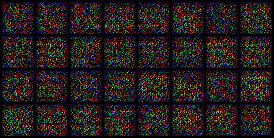

images/epoch6_generator.png


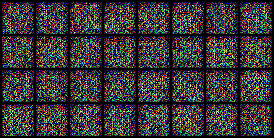

images/epoch11_generator.png


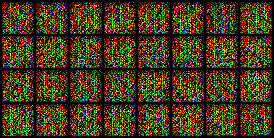

images/epoch16_generator.png


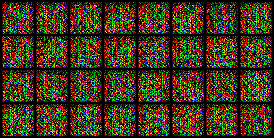

images/epoch21_generator.png


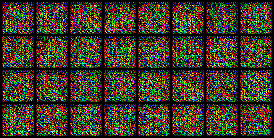

images/epoch26_generator.png


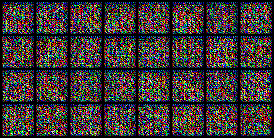

images/epoch31_generator.png


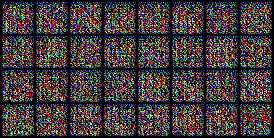

images/epoch36_generator.png


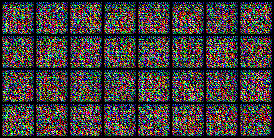

images/epoch41_generator.png


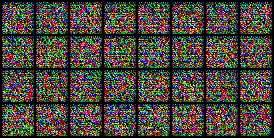

images/epoch46_generator.png


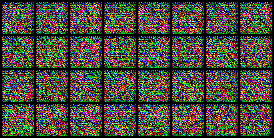

images/epoch51_generator.png


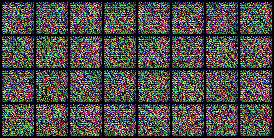

images/epoch56_generator.png


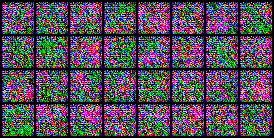

images/epoch61_generator.png


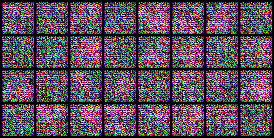

images/epoch66_generator.png


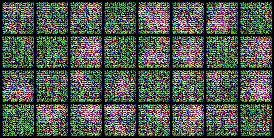

images/epoch71_generator.png


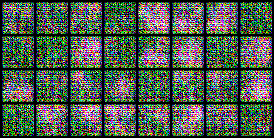

images/epoch76_generator.png


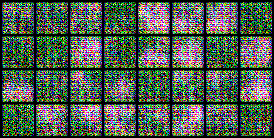

images/epoch81_generator.png


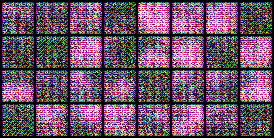

images/epoch86_generator.png


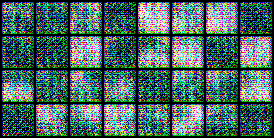

images/epoch91_generator.png


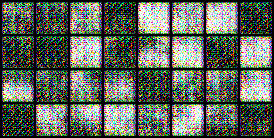

images/epoch96_generator.png


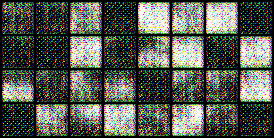

images/epoch101_generator.png


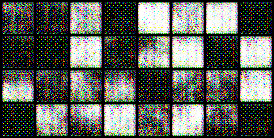

images/epoch106_generator.png


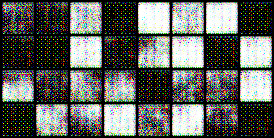

images/epoch111_generator.png


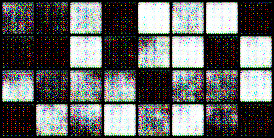

images/epoch116_generator.png


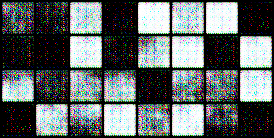

images/epoch121_generator.png


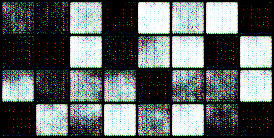

images/epoch126_generator.png


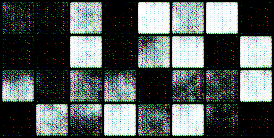

images/epoch131_generator.png


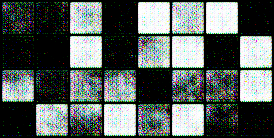

images/epoch136_generator.png


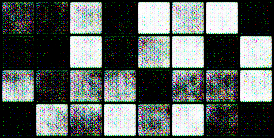

images/epoch141_generator.png


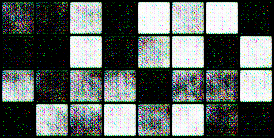

images/epoch146_generator.png


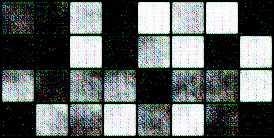

images/epoch151_generator.png


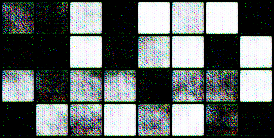

images/epoch156_generator.png


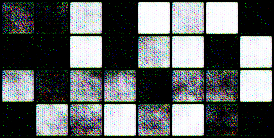

images/epoch161_generator.png


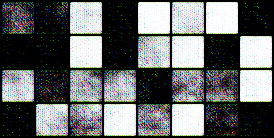

images/epoch166_generator.png


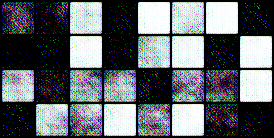

images/epoch171_generator.png


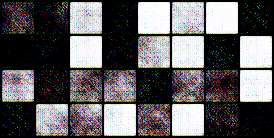

images/epoch176_generator.png


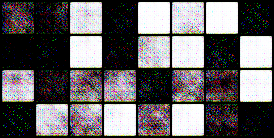

images/epoch181_generator.png


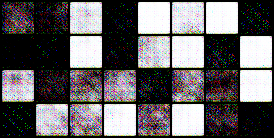

images/epoch186_generator.png


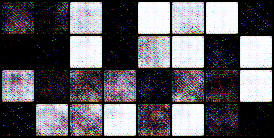

images/epoch191_generator.png


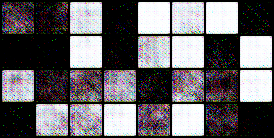

images/epoch196_generator.png


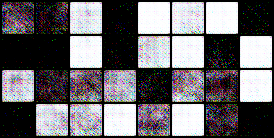

images/epoch201_generator.png


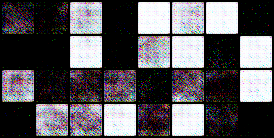

images/epoch206_generator.png


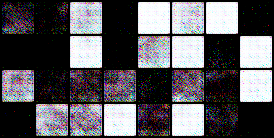

images/epoch211_generator.png


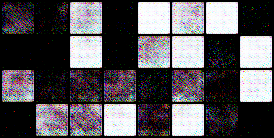

images/epoch216_generator.png


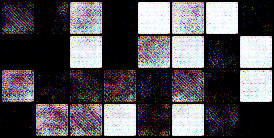

images/epoch221_generator.png


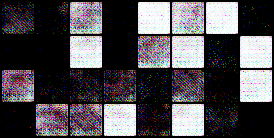

images/epoch226_generator.png


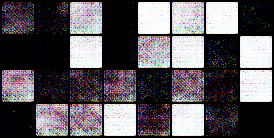

images/epoch231_generator.png


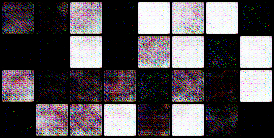

images/epoch236_generator.png


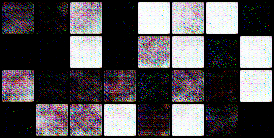

images/epoch241_generator.png


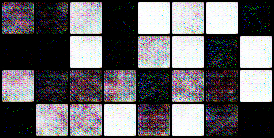

images/epoch246_generator.png


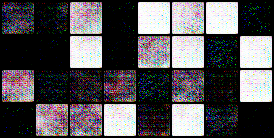

images/epoch251_generator.png


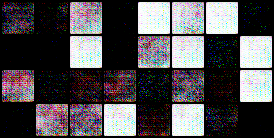

images/epoch256_generator.png


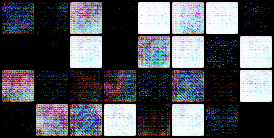

images/epoch261_generator.png


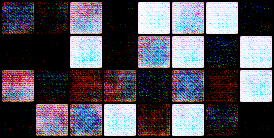

images/epoch266_generator.png


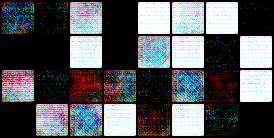

images/epoch271_generator.png


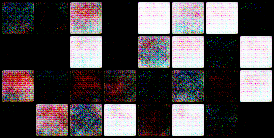

images/epoch276_generator.png


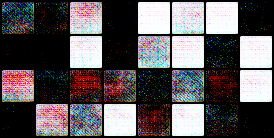

images/epoch281_generator.png


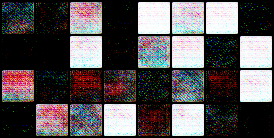

images/epoch286_generator.png


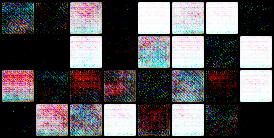

images/epoch291_generator.png


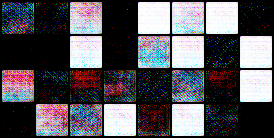

images/epoch296_generator.png


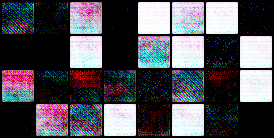

images/epoch301_generator.png


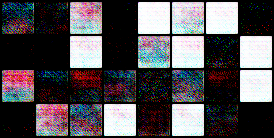

images/epoch306_generator.png


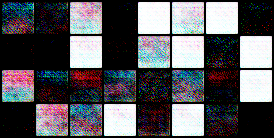

images/epoch311_generator.png


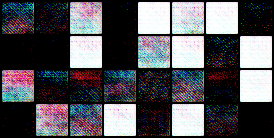

images/epoch316_generator.png


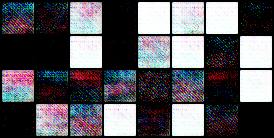

images/epoch321_generator.png


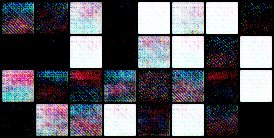

images/epoch326_generator.png


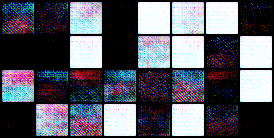

images/epoch331_generator.png


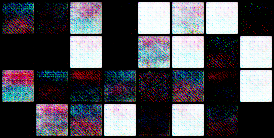

images/epoch336_generator.png


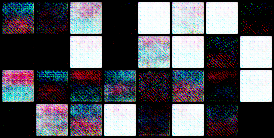

images/epoch341_generator.png


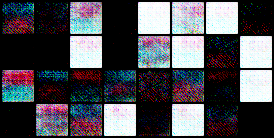

images/epoch346_generator.png


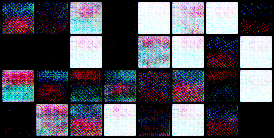

images/epoch351_generator.png


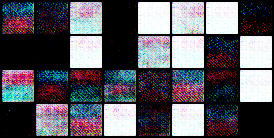

images/epoch356_generator.png


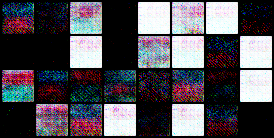

images/epoch361_generator.png


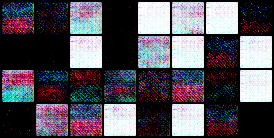

images/epoch366_generator.png


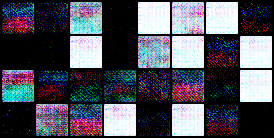

images/epoch371_generator.png


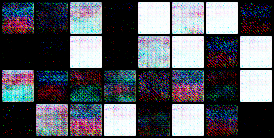

images/epoch376_generator.png


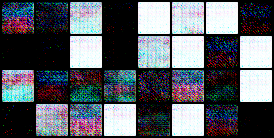

images/epoch381_generator.png


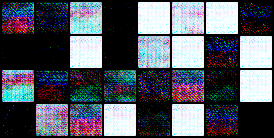

images/epoch386_generator.png


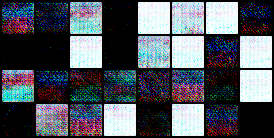

images/epoch391_generator.png


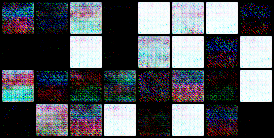

images/epoch396_generator.png


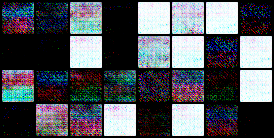

images/epoch401_generator.png


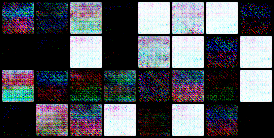

images/epoch406_generator.png


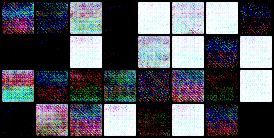

images/epoch411_generator.png


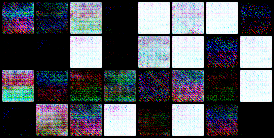

images/epoch416_generator.png


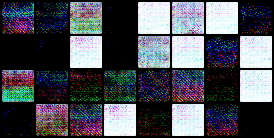

images/epoch421_generator.png


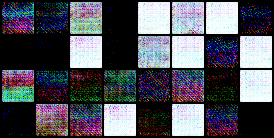

images/epoch426_generator.png


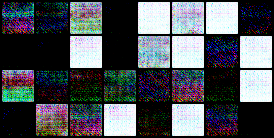

images/epoch431_generator.png


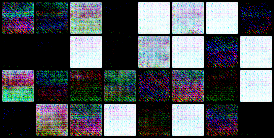

images/epoch436_generator.png


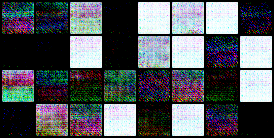

images/epoch441_generator.png


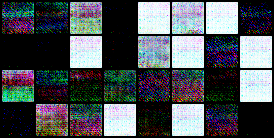

images/epoch446_generator.png


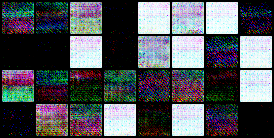

images/epoch451_generator.png


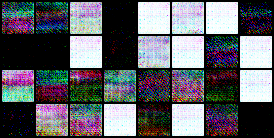

images/epoch456_generator.png


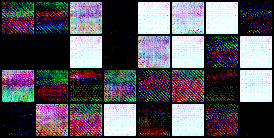

images/epoch461_generator.png


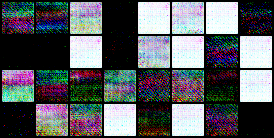

images/epoch466_generator.png


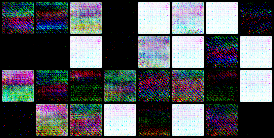

images/epoch471_generator.png


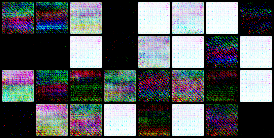

images/epoch476_generator.png


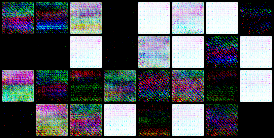

images/epoch481_generator.png


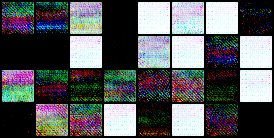

images/epoch486_generator.png


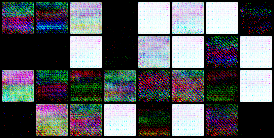

images/epoch491_generator.png


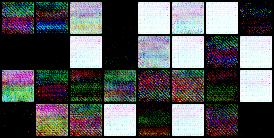

images/epoch496_generator.png


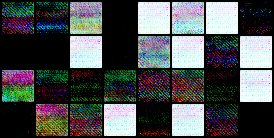

images/epoch501_generator.png


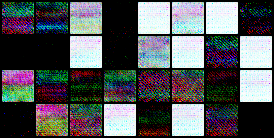

images/epoch506_generator.png


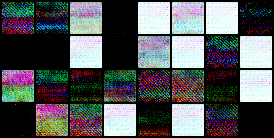

images/epoch511_generator.png


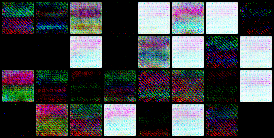

images/epoch516_generator.png


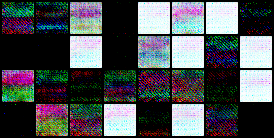

images/epoch521_generator.png


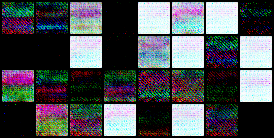

images/epoch526_generator.png


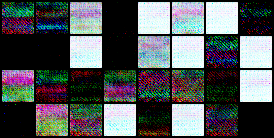

images/epoch531_generator.png


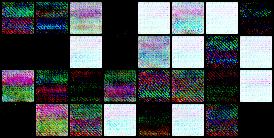

images/epoch536_generator.png


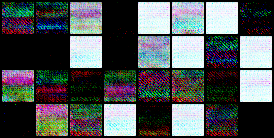

images/epoch541_generator.png


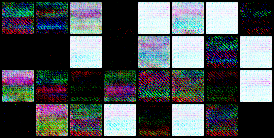

images/epoch546_generator.png


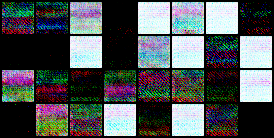

images/epoch551_generator.png


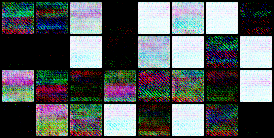

images/epoch556_generator.png


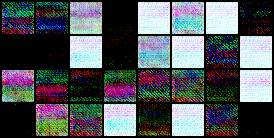

images/epoch561_generator.png


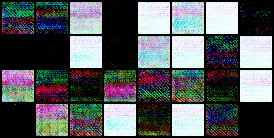

images/epoch566_generator.png


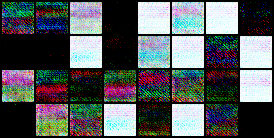

images/epoch571_generator.png


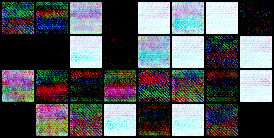

images/epoch576_generator.png


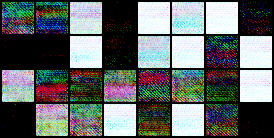

images/epoch581_generator.png


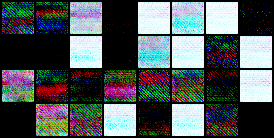

images/epoch586_generator.png


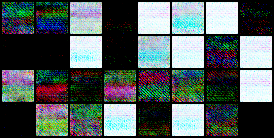

images/epoch591_generator.png


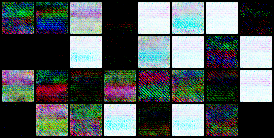

images/epoch596_generator.png


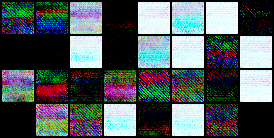

images/epoch601_generator.png


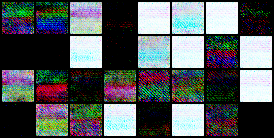

images/epoch606_generator.png


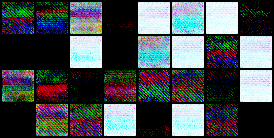

images/epoch611_generator.png


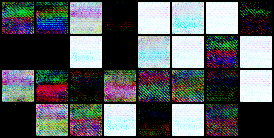

images/epoch616_generator.png


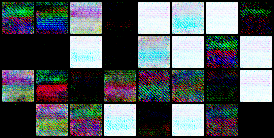

images/epoch621_generator.png


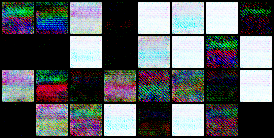

images/epoch626_generator.png


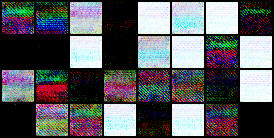

images/epoch631_generator.png


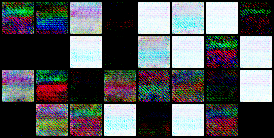

images/epoch636_generator.png


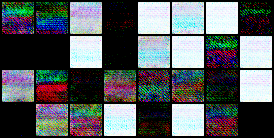

images/epoch641_generator.png


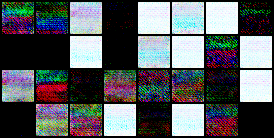

images/epoch646_generator.png


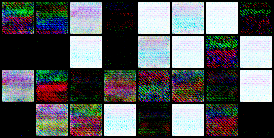

images/epoch651_generator.png


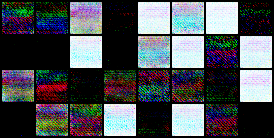

images/epoch656_generator.png


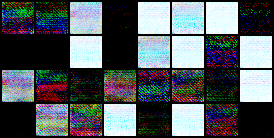

images/epoch661_generator.png


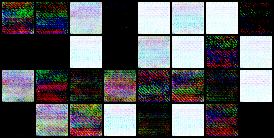

images/epoch666_generator.png


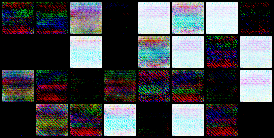

images/epoch671_generator.png


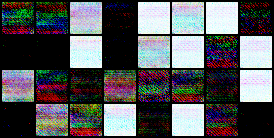

images/epoch676_generator.png


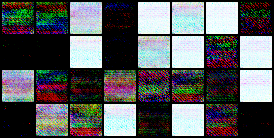

images/epoch681_generator.png


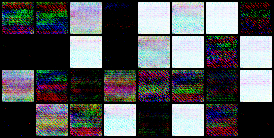

images/epoch686_generator.png


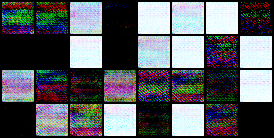

images/epoch691_generator.png


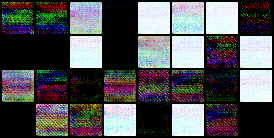

images/epoch696_generator.png


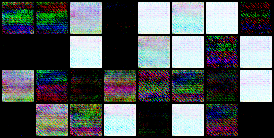

In [48]:
for i in range(1,701, 5):
  path = 'images/epoch' + str(i) + '_generator.png'
  print(path)
  sample = cv2.imread(path)
  cv2_imshow(sample)

In [82]:
sample = cv2.imread('images/epoch13_generator.png')
sample.shape

(138, 274, 3)

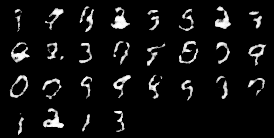

In [83]:
cv2_imshow(sample)

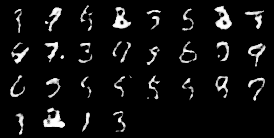

In [81]:
cv2_imshow(sample)


In [0]:
import torch

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive
